### Introduction to Computer Vision (Fall 2022)
Instructor: Muhammad Fahim \\
TA: Batul Yaseen, Karam Almaghout


### Acknowledgement
This lab was maintained by Rauf, Marcus, Rufina, Alex, Batul, Karam and Fahim \\


## Lab Objectives
Descriptors, Detectors

## Import libraries, download images

In [ ]:
from IPython.display import clear_output
!pip install opencv-python==3.4.2.16
!pip install opencv-contrib-python==3.4.2.16
clear_output()

In [14]:
# all plots will be set directly below the code cell that produced it
%matplotlib inline
from matplotlib import pyplot as plt
from IPython.display import clear_output
# set inline plots size
plt.rcParams["figure.figsize"] = (16, 10) # (w, h)
# remove grid lines
import numpy as np
import time
import cv2

## Download images

In [2]:
!wget https://сезоны-года.рф/sites/default/files/images/shkolnikam/gora.jpg -O mountains.jpg
!wget https://www.dropbox.com/s/yxysjtnin820jmm/mouse.jpg?dl=0 -O mouse.jpg
!wget https://www.dropbox.com/s/gm8xj8we22ejfhk/mouse_scene.jpg?dl=0 -O mouse_scene.jpg
!wget https://www.dropbox.com/s/z7b3idqc1y06lg7/panorama1.jpg?dl=0 -O panorama1.jpg
!wget https://www.dropbox.com/s/pg0i5224u02oc2n/panorama2.jpg?dl=0 -O panorama2.jpg
!wget https://www.dropbox.com/s/polov0shkbst4lu/book.jpg?dl=0 -O book.jpg
!wget https://www.dropbox.com/s/7e5pn66y10x0584/book_scene.jpg?dl=0 -O book_scene.jpg
!wget https://www.dropbox.com/s/tw6yyoh7bor87zs/book_scene_2.jpg?dl=0 -O book_scene_2.jpg
clear_output()

## Helper functions

In [15]:
# funcrion to read and resize an image
def read_and_resize(filename, grayscale=False, fx=0.5, fy=0.5):
    if grayscale:
        img_result = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
    else:
        imgbgr = cv2.imread(filename, cv2.IMREAD_COLOR)
        # convert to rgb
        img_result = cv2.cvtColor(imgbgr, cv2.COLOR_BGR2RGB)
    # resize
    img_result = cv2.resize(img_result, None, fx=fx, fy=fy, interpolation=cv2.INTER_CUBIC)
    return img_result


def showInRow(list_of_images, titles=None, disable_ticks=False):
    count = len(list_of_images)
    for idx in range(count):
        subplot = plt.subplot(1, count, idx + 1)
        if titles is not None:
            subplot.set_title(titles[idx])

        img = list_of_images[idx]
        cmap = 'gray' if (len(img.shape) == 2 or img.shape[2] == 1) else None
        subplot.imshow(img, cmap=cmap)
        if disable_ticks:
            plt.xticks([]), plt.yticks([])
    plt.show()

## Harris corner detector

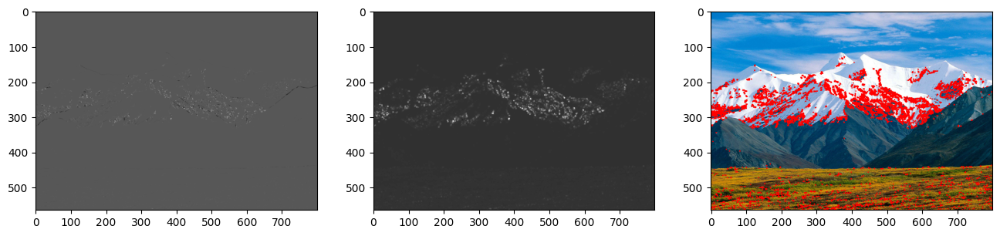

In [16]:
mountains_img = read_and_resize('mountains.jpg')

gray = cv2.cvtColor(mountains_img,cv2.COLOR_RGB2GRAY)

# cv.cornerHarris(src, blockSize, ksize, k)
# blockSize	Neighborhood size.
# ksize	Aperture parameter for the Sobel operator.
corners = cv2.cornerHarris(gray,2,3,0.04)

# Results are marked through the dilated corners 
dest = cv2.dilate(corners, None) 
  
# Reverting back to the original image, 
# with optimal threshold value 
mountains_img[dest > 0.01 * dest.max()]=[255, 0, 0] 

    
showInRow([corners, dest, mountains_img])

## Exercise: Implement Harris corner detector

In [36]:
def find_local_maxima(src, ksize):
    (h, w) = src.shape
    pad_img = np.zeros((h+ksize, w+ksize))
    pad_img[ksize//2:h+ksize//2, ksize//2:w+ksize//2] = src
    dst = np.zeros((h, w))

    for row in range(h):
        for col in range(w):
            max_val = np.max(pad_img[row : row+ksize, col:col+ksize])
            if max_val == 0:
                continue
            if src[row, col] == max_val:
                dst[row, col] = src[row, col]

    return dst

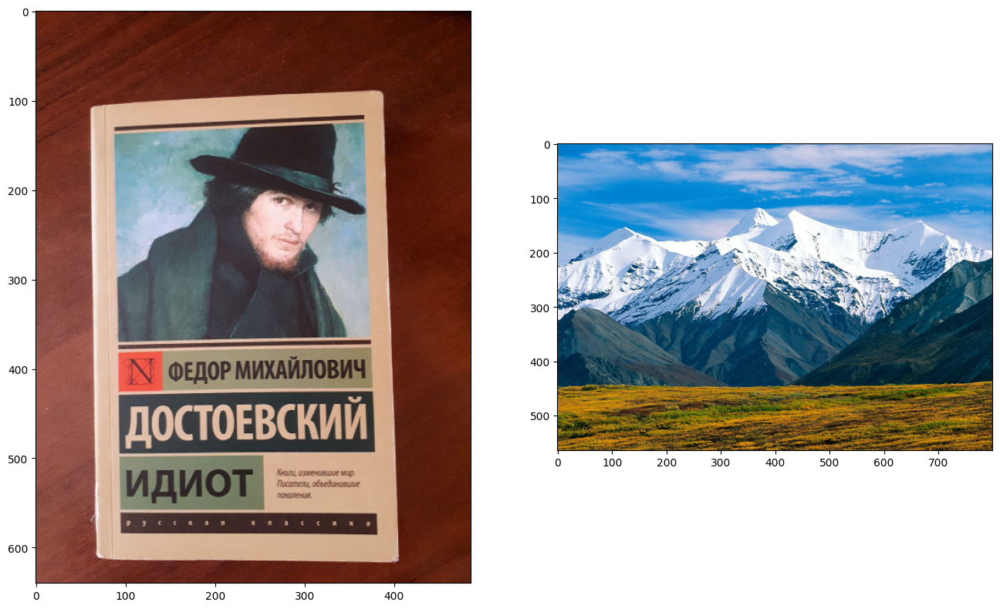

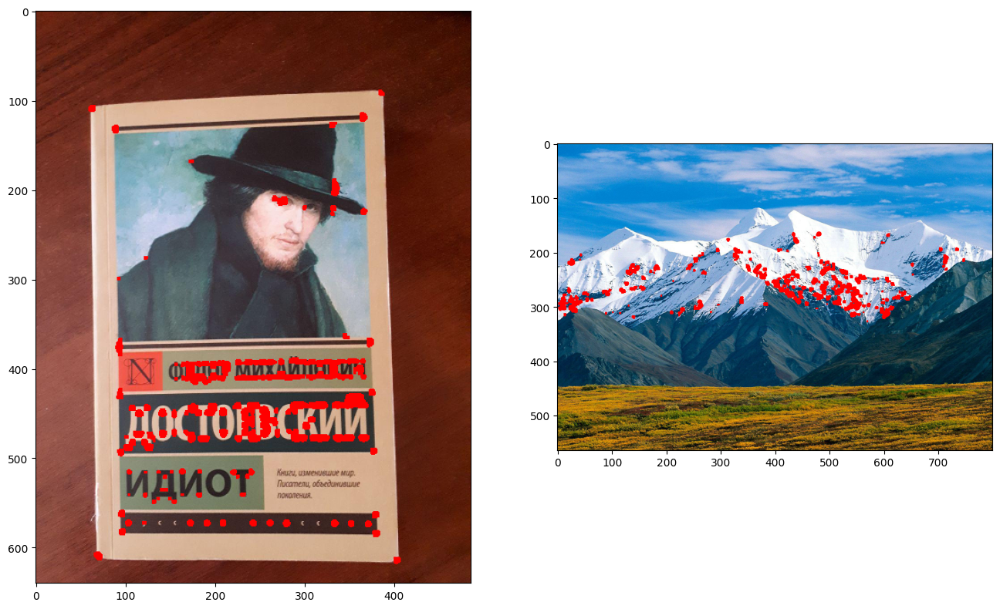

In [41]:
from tkinter import OFF


def harris(img, k = 0.04):
    # convert image to a grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # smoothen the image
    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    # find derivatives
    Ix = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    Iy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

    # calculate combination of derivatives to calculate structure tensors
    Ixx = Ix * Ix
    Ixy = Ix * Iy
    Iyy = Iy * Iy

    # calculate the sum of structure tensors
    detA = Ixx * Iyy - Ixy * Ixy
    traceA = Ixx + Iyy

    harris_response = detA - k * traceA * traceA

    # Harris response calculation
    # Remember to account for the window size! Only use full sized windows!
    w_size = 3

    height, width = harris_response.shape

    for y in range(w_size, height - w_size):
        for x in range(w_size, width - w_size):
            Sxx = np.sum(Ixx[y - w_size:y + w_size + 1, x - w_size:x + w_size + 1])
            Sxy = np.sum(Ixy[y - w_size:y + w_size + 1, x - w_size:x + w_size + 1])
            Syy = np.sum(Iyy[y - w_size:y + w_size + 1, x - w_size:x + w_size + 1])

            det = (Sxx * Syy) - (Sxy ** 2)
            trace = Sxx + Syy
            r = det - k * trace ** 2
            harris_response[y, x] = r

    # Dilate responses to make them more visible
    dest = cv2.dilate(harris_response, None)

    # # Color pixels in the original image red, where
    # # the Harris response is above a given threshold
    img[dest > 0.1 * dest.max()]=[255, 0, 0]

    return img


# CHECK YOUR IMPLEMENTATION
book_img = read_and_resize('book.jpg')
mountains_img = read_and_resize('mountains.jpg')

showInRow([book_img, mountains_img])

books_img_c = harris(book_img, k = 0.04)
mountains_img_c = harris(mountains_img, k = 0.04)

showInRow([books_img_c, mountains_img_c])

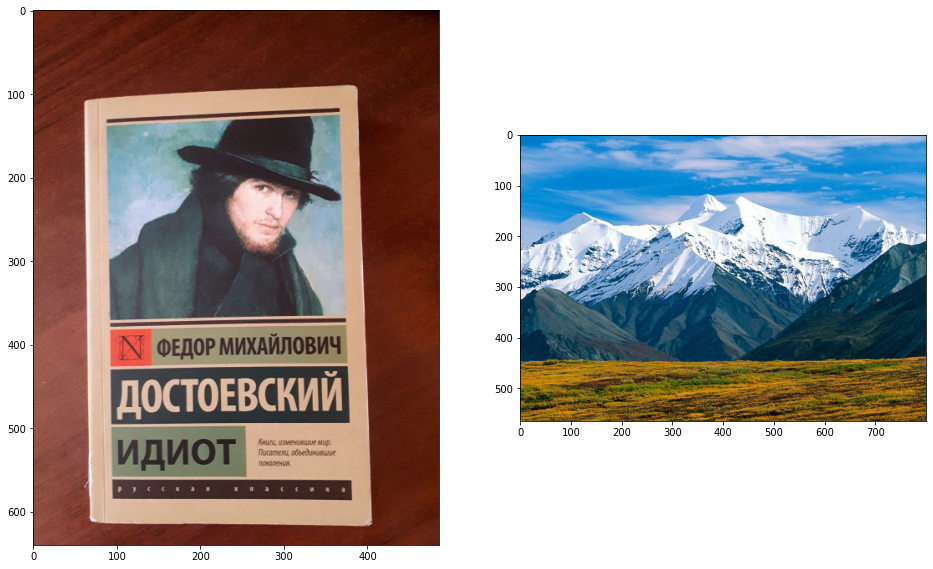

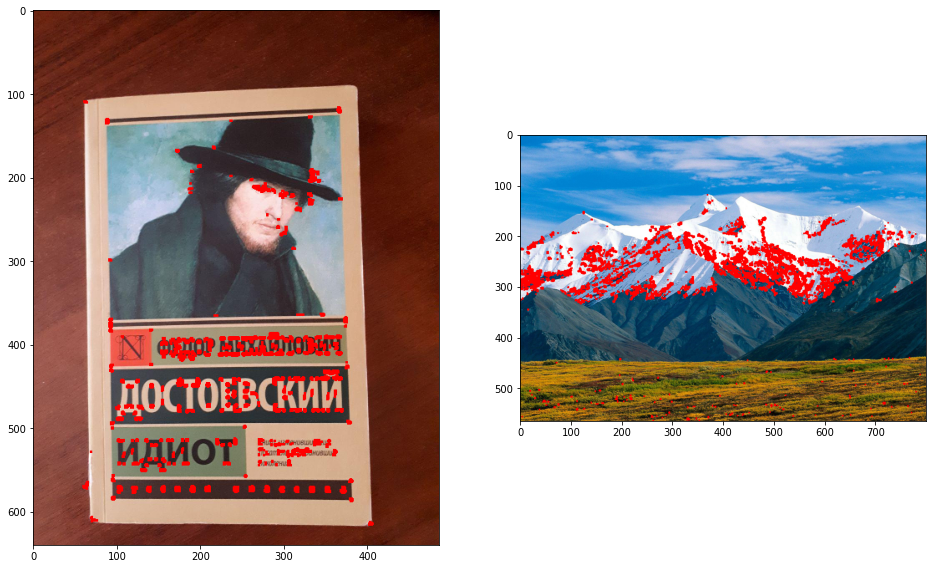

In [ ]:
def harris(img, k = 0.04):
  # convert image to a grayscale
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  # smoothen the image
  gray = < your code here >

  # find derivatives
  < your code here >

  # calculate combination of derivatives to calculate structure tensors
  < your code here >

  # Harris response calculation
  # Remember to account for the window size! Only use full sized windows!
  w_size = 3
  < your code here >

  # Dilate responses to make them more visible
  dest = cv2.dilate(corners, None)

  # Color pixels in the original image red, where
  # the Harris response is above a given threshold
  img[dest > 0.1 * dest.max()]=[255, 0, 0]

  return img


# CHECK YOUR IMPLEMENTATION
book_img = read_and_resize('book.jpg')
mountains_img = read_and_resize('mountains.jpg')

showInRow([book_img, mountains_img])

books_img_c = harris(book_img, k = 0.04)
mountains_img_c = harris(mountains_img, k = 0.04)

showInRow([books_img_c, mountains_img_c])

## SIFT

Number of key points: <class 'cv2.KeyPoint'>
Key point type is: <class 'cv2.KeyPoint'>


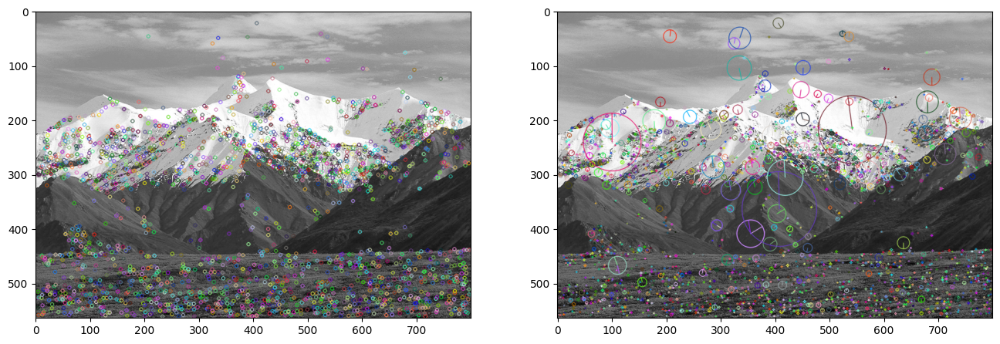

In [44]:
mountains_img = read_and_resize('mountains.jpg')
img = mountains_img.copy()

gray= cv2.cvtColor(mountains_img,cv2.COLOR_BGR2GRAY)
sift = cv2.xfeatures2d.SIFT_create()
kp = sift.detect(gray,None)

print(f'Number of key points: {type(kp[0])}')
print(f'Key point type is: {type(kp[0])}')
gray2 = gray.copy()
img2 = img.copy()

img=cv2.drawKeypoints(gray,kp,img)
img2=cv2.drawKeypoints(gray2,kp,img2,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

showInRow([img, img2])

**cv2.KeyPoint** attributes:

angle
 
octave - octave (pyramid layer) from which the keypoint has been extracted
 
pt - coordinates of the keypoints
 
response - the response by which the most strong keypoints have been selected.
 
size - diameter of the meaningful keypoint neighborhood



## SIFT usage

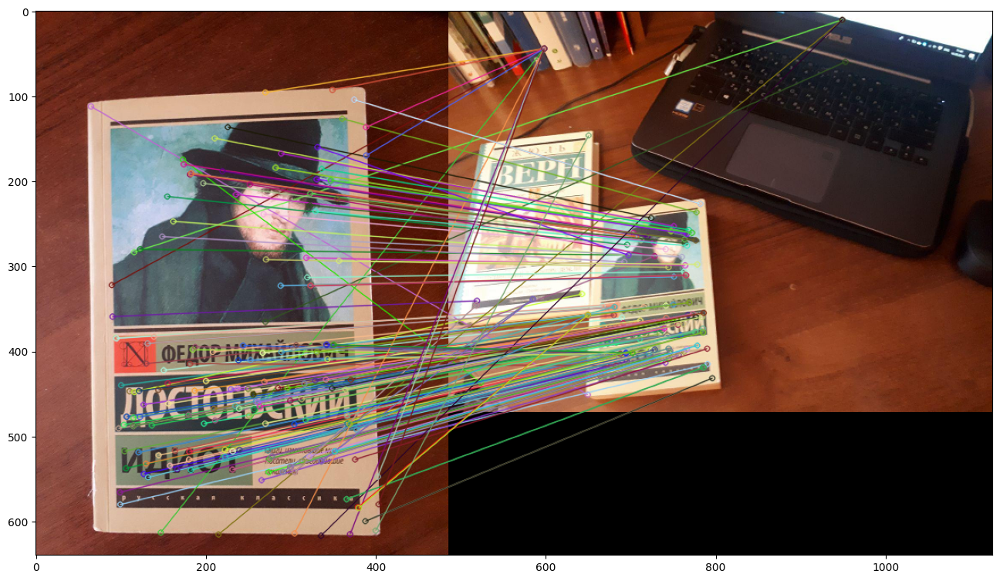

(<matplotlib.image.AxesImage at 0x168d54fd0>, None)

In [45]:
book = read_and_resize('book.jpg', 0)
scene = read_and_resize('book_scene.jpg', 0)

sift = cv2.xfeatures2d.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(book,None)
kp2, des2 = sift.detectAndCompute(scene,None)

# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])

# cv2.drawMatchesKnn expects list of lists as matches.
img3 = cv2.drawMatchesKnn(book,kp1,scene,kp2,good,None,flags=2)

plt.imshow(img3),plt.show()

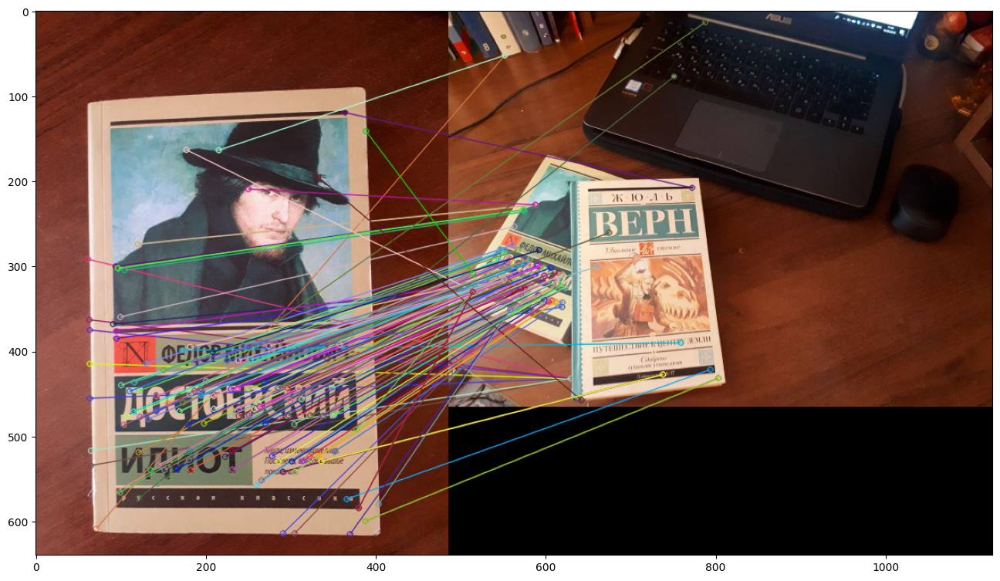

(<matplotlib.image.AxesImage at 0x169133790>, None)

In [48]:
book = read_and_resize('book.jpg', 0)
scene = read_and_resize('book_scene_2.jpg', 0)

sift = cv2.xfeatures2d.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(book,None)
kp2, des2 = sift.detectAndCompute(scene,None)


# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])

# cv2.drawMatchesKnn expects list of lists as matches.
img3 = cv2.drawMatchesKnn(book,kp1,scene,kp2,good,None,flags=2)

plt.imshow(img3),plt.show()

## One more example

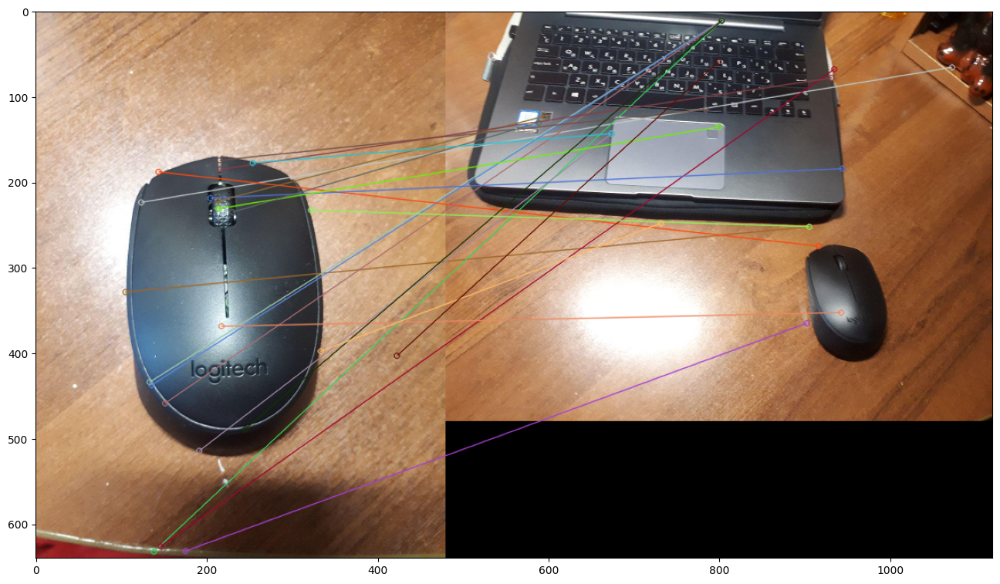

(<matplotlib.image.AxesImage at 0x169022100>, None)

In [50]:
mouse = read_and_resize('mouse.jpg', 0)
scene = read_and_resize('mouse_scene.jpg', 0)

sift = cv2.xfeatures2d.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(mouse,None)
kp2, des2 = sift.detectAndCompute(scene,None)


# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.8*n.distance:
        good.append([m])

# cv2.drawMatchesKnn expects list of lists as matches.
# img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,flags=2)
img3 = cv2.drawMatchesKnn(mouse,kp1,scene,kp2,good,None,flags=2)

plt.imshow(img3),plt.show()

## Panoramas creating using SIFT

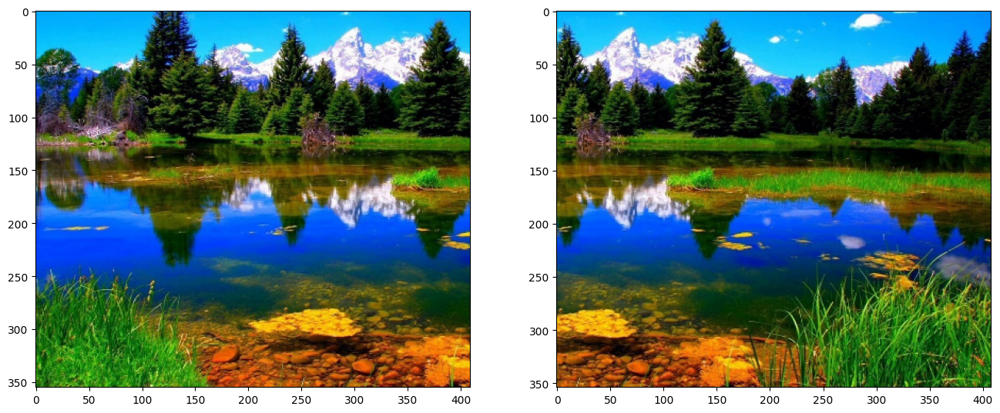

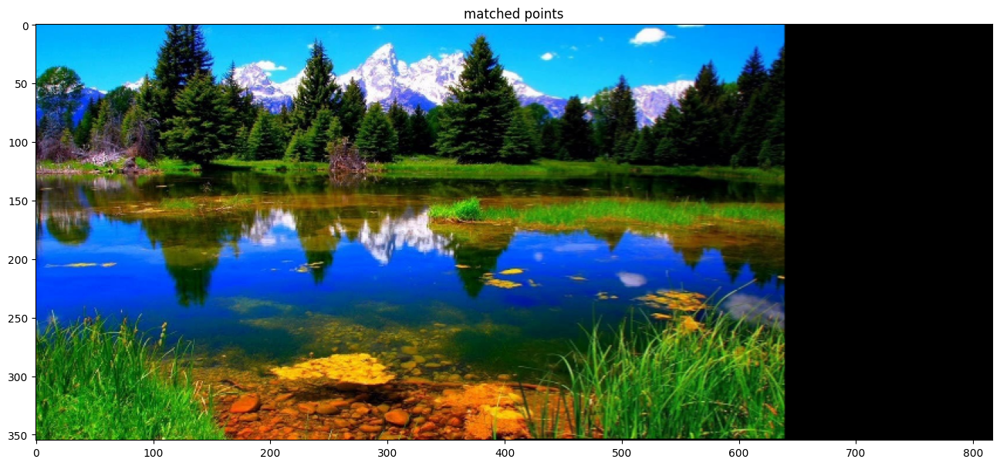

(<matplotlib.image.AxesImage at 0x168a87100>,
 Text(0.5, 1.0, 'matched points'),
 None)

In [52]:
scene1 = read_and_resize('panorama1.jpg', 0)
scene2 = read_and_resize('panorama2.jpg', 0)

showInRow([scene1, scene2])

sift = cv2.xfeatures2d.SIFT_create()
# find the keypoints and descriptors with SIFT
kpsA, featuresA = sift.detectAndCompute(scene2,None)
kpsB, featuresB = sift.detectAndCompute(scene1,None)

# MATCH KEY POINTS
bf = cv2.BFMatcher()
matches = bf.knnMatch(featuresA,featuresB, k=2)

# Apply ratio test
good = []
good_matches = []
for m in matches:
  if len(m) == 2 and m[0].distance < m[1].distance * 0.75:
    good_matches.append((m[0].trainIdx, m[0].queryIdx))
    good.append([m[0]])

# img3 = cv2.drawMatchesKnn(mouse,kpsA,scene,kpsB,good,None,flags=2)
# plt.imshow(img3),plt.show()    

kpsA = np.float32([kp.pt for kp in kpsA])
kpsB = np.float32([kp.pt for kp in kpsB])

# we can compute homogarphy only when we have more than 4 points
if len(good_matches) > 4:
  ptsA = np.float32([kpsA[i] for (_, i) in good_matches])
  ptsB = np.float32([kpsB[i] for (i, _) in good_matches])
  
  H, status = cv2.findHomography(ptsA, ptsB, cv2.RANSAC,  4.0)
        
# sew together
result = cv2.warpPerspective(scene2, H,(scene2.shape[1] + scene1.shape[1], max(scene2.shape[0],scene1.shape[0])))
result[0:scene1.shape[0], 0:scene1.shape[1]] = scene1

plt.imshow(result),plt.title('matched points'), plt.show()

## Object detection using sift

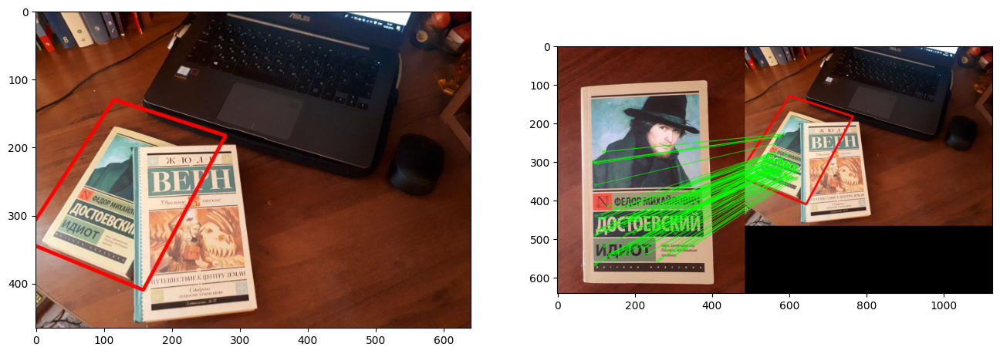

In [53]:
book = read_and_resize('book.jpg', 0)
scene = read_and_resize('book_scene_2.jpg', 0)

MIN_MATCH_COUNT = 10

sift = cv2.xfeatures2d.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(book,None)
kp2, des2 = sift.detectAndCompute(scene,None)


# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.75*n.distance:
        good.append(m)


if len(good)>MIN_MATCH_COUNT:
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
    matchesMask = mask.ravel().tolist()

    h,w,c = book.shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,M)

    scene = cv2.polylines(scene,[np.int32(dst)],True,255,3, cv2.LINE_AA)

else:
    print ("Not enough matches are found - %d/%d" % (len(good),MIN_MATCH_COUNT))
    matchesMask = None
    
draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)

img3 = cv2.drawMatches(book,kp1,scene,kp2,good,None,**draw_params)

showInRow([scene, img3])

## References

harris corner detector [link](https://muthu.co/harris-corner-detector-implementation-in-python/)

SIFT [link](https://docs.opencv.org/trunk/da/df5/tutorial_py_sift_intro.html)

SIFT Python Implementation [link](https://medium.com/@lerner98/implementing-sift-in-python-36c619df7945)

Panoramas [link](https://www.pyimagesearch.com/2016/01/11/opencv-panorama-stitching/)

Object detection with SIFT [link](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_feature_homography/py_feature_homography.html)